In [1]:
import pandas as pd
import numpy as np
from random import *
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import files
files.upload()

Saving clean_kaggle_data_2022.csv to clean_kaggle_data_2022.csv


{'clean_kaggle_data_2022.csv': b'Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q6_10,Q6_11,Q6_12,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Q7_6,Q7_7,Q8,Q9,Q10_1,Q10_2,Q10_3,Q11,Q12_1,Q12_2,Q12_3,Q12_4,Q12_5,Q12_6,Q12_7,Q12_8,Q12_9,Q12_10,Q12_11,Q12_12,Q12_13,Q12_14,Q12_15,Q13_1,Q13_2,Q13_3,Q13_4,Q13_5,Q13_6,Q13_7,Q13_8,Q13_9,Q13_10,Q13_11,Q13_12,Q13_13,Q13_14,Q14_1,Q14_2,Q14_3,Q14_4,Q14_5,Q14_6,Q14_7,Q14_8,Q14_9,Q14_10,Q14_11,Q14_12,Q14_13,Q14_14,Q14_15,Q14_16,Q15_1,Q15_2,Q15_3,Q15_4,Q15_5,Q15_6,Q15_7,Q15_8,Q15_9,Q15_10,Q15_11,Q15_12,Q15_13,Q15_14,Q15_15,Q16,Q17_1,Q17_2,Q17_3,Q17_4,Q17_5,Q17_6,Q17_7,Q17_8,Q17_9,Q17_10,Q17_11,Q17_12,Q17_13,Q17_14,Q17_15,Q18_1,Q18_2,Q18_3,Q18_4,Q18_5,Q18_6,Q18_7,Q18_8,Q18_9,Q18_10,Q18_11,Q18_12,Q18_13,Q18_14,Q19_1,Q19_2,Q19_3,Q19_4,Q19_5,Q19_6,Q19_7,Q19_8,Q20_1,Q20_2,Q20_3,Q20_4,Q20_5,Q20_6,Q21_1,Q21_2,Q21_3,Q21_4,Q21_5,Q21_6,Q21_7,Q21_8,Q21_9,Q21_10,Q22,Q23,Q24,Q25,Q26,Q27,Q28_1,Q28_2,Q28_3,Q28_4,Q28_5,Q28_6,Q28_7,Q28_8,Q29,Q30,Q31_1,Q31

In [3]:
salaries = pd.read_csv("./clean_kaggle_data_2022.csv", low_memory = False, encoding = 'latin2')
salaries.shape

(8137, 298)

In [4]:
salaries.head()

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,NaN,NaN
1,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,Coursera,edX,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"


# Question 1: Data Cleaning

- Drop the second row since it is about the question details
- Drop other information too if they are irrelevant to the task

In [5]:
def CleanData(df):
    # Store the first row (question details) as a separate variable
    questions = df.iloc[0].copy()  # Copy the first row to avoid reference issues

    # Drop the first row (question details)
    df.drop(df.index[0], inplace=True)

    # Drop the first column if it's irrelevant (adjust as needed)
    df.drop(df.columns[0], axis=1, inplace=True)

    # Return the cleaned DataFrame and the stored questions
    return df, questions

# Using the CleanData function
salaries, questions = CleanData(salaries)

# Check the shapes and contents
print("Cleaned Data Shape:", salaries.shape)
print("Stored Questions:", questions)
salaries.shape

Cleaned Data Shape: (8136, 297)
Stored Questions: Duration (in seconds)                                Duration (in seconds)
Q2                                             What is your age (# years)?
Q3                                  What is your gender? - Selected Choice
Q4                               In which country do you currently reside?
Q5                       Are you currently a student? (high school, uni...
                                               ...                        
Q44_10                   Who/what are your favorite media sources that ...
Q44_11                   Who/what are your favorite media sources that ...
Q44_12                   Who/what are your favorite media sources that ...
Q29_Encoded                                                            NaN
Q29_buckets                                                            NaN
Name: 0, Length: 298, dtype: object


(8136, 297)

###**Impute missing values (single column responses)**

1. Identify columns with single column responses

2. Address missing values in those columns

In [6]:
#TODO: address missing values in single column responses in df
def f0(x: pd.DataFrame, s):
    result_df = x.copy()
    for column in result_df.columns:
        if("_" in column and s):
            continue
        if("_" not in column and not s):
            continue
        if result_df[column].dtype == 'object':
            result_df[column].fillna("Unknown", inplace=True)
        else:
            pass
    return result_df


def ImputingSingleColMissingValues(df):
    # Tips: Include Q29_Encoded (target) in the single_col_names
    # so that its row size stays same as other rows after data preprocessing
    single_col_names = [col for col in df.columns if "_" not in col or col == "Q29_Encoded"]
    print("Single column names:", single_col_names)
    print("Percentage of null values: ")
    print(df[single_col_names].isnull().sum()*100/len(df))
    df = f0(df, 1)
    print("Percentage of null values (make sure they are all zeros): ")
    print(df[single_col_names].isnull().sum()*100/len(df))
    assert df[single_col_names].isnull().values.sum() == 0, \
        "There are still missing values remaining!"

    return df
dataSet = ImputingSingleColMissingValues(salaries.copy())


Single column names: ['Q2', 'Q3', 'Q4', 'Q5', 'Q8', 'Q9', 'Q11', 'Q16', 'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'Q27', 'Q29', 'Q30', 'Q32', 'Q43', 'Q29_Encoded']
Percentage of null values: 
Q2              0.000000
Q3              0.000000
Q4              0.000000
Q5              0.000000
Q8              0.000000
Q9             36.147984
Q11             0.000000
Q16             8.407080
Q22            80.162242
Q23             0.000000
Q24             0.000000
Q25             0.000000
Q26             0.000000
Q27             0.000000
Q29             0.000000
Q30             0.614553
Q32            77.126352
Q43            45.759587
Q29_Encoded     0.000000
dtype: float64
Percentage of null values (make sure they are all zeros): 
Q2             0.0
Q3             0.0
Q4             0.0
Q5             0.0
Q8             0.0
Q9             0.0
Q11            0.0
Q16            0.0
Q22            0.0
Q23            0.0
Q24            0.0
Q25            0.0
Q26            0.0
Q27            0.0


###**Encode categorical features (sinlge column responses)**

In [7]:
#TODO: Encode categorical features in the single column responses

def f1(x:pd.core.frame.DataFrame, s):
  # s = 0 -> Multi column handler.
  # s = 1 -> Single column handler.
  # This function shall return a tuple where
  #     f1()[0] -> Result Data Frame
  #     f1()[1] -> Dictionary.
  D = {}
  # Exclude the first and second columns, starting from the third column
  for j in range(0, x.shape[1]):
    single = True
    multi = True
    list = []
    for i in range(x.shape[0]):
      if(("_" in x.columns[j] and s)):
        single = False
        break
      elif(("_" not in x.columns[j] and not s)):
        multi = False
        break
      elif(x.iloc[i, j] not in list):
        list.append(x.iloc[i, j])
        x.iloc[i, j] = list.index(x.iloc[i, j])
      elif(x.iloc[i, j] in list):
        x.iloc[i, j] = list.index(x.iloc[i, j])
    if(single and s):
      D[x.columns[j]] = list
    elif(multi and not s):
      D[x.columns[j]] = list
  return (x, D)
result = f1(dataSet, 1)
dataSet, single_column_encode_table = result[0], result[1]
print(dataSet)
print(single_column_encode_table)




     Q2 Q3  Q4 Q5      Q6_1 Q6_2                  Q6_3      Q6_4     Q6_5  \
1     0  0   0  0  Coursera  NaN  Kaggle Learn Courses       NaN      NaN   
2     1  0   1  0  Coursera  edX                   NaN       NaN      NaN   
3     2  0   2  0  Coursera  NaN  Kaggle Learn Courses       NaN      NaN   
4     3  0   3  0  Coursera  NaN  Kaggle Learn Courses       NaN  Fast.ai   
5     3  0   3  0  Coursera  NaN                   NaN       NaN      NaN   
...  .. ..  .. ..       ...  ...                   ...       ...      ...   
8132  3  0   3  0       NaN  NaN  Kaggle Learn Courses  DataCamp      NaN   
8133  7  0  14  0       NaN  NaN                   NaN       NaN      NaN   
8134  3  0  14  0       NaN  NaN                   NaN  DataCamp      NaN   
8135  5  0  18  0       NaN  NaN                   NaN  DataCamp      NaN   
8136  7  1  40  0       NaN  NaN  Kaggle Learn Courses       NaN      NaN   

         Q6_6  ...                                              Q44_5  \
1 

###**Handling categorical features (multi column responses)**

In [8]:
def ImputingMultiColMissingValues(df):
    multi_col_names = [col for col in df.columns if "_" in col]
    print("Multi-column names:", multi_col_names)
    print("Percentage of null values before imputation: ")
    print(df[multi_col_names].isnull().sum() * 100 / len(df))

    # Impute missing values in multi-column names
    df = f0(df, 0)  # Pass `0` to process multi-column names in `f0`

    print("Percentage of null values after imputation (should be all zeros): ")
    print(df[multi_col_names].isnull().sum() * 100 / len(df))

    # Ensure there are no missing values left in multi-column names
    assert df[multi_col_names].isnull().values.sum() == 0, \
        "There are still missing values remaining in multi-column names!"

    return df

# Run the imputation function
dataSet = ImputingMultiColMissingValues(dataSet)

# Apply multi-column encoding
result = f1(dataSet, 0)  # Pass `0` to indicate multi-column encoding
dataSet, multi_column_encode_table = result
print(dataSet)
print(multi_column_encode_table)


Multi-column names: ['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_11', 'Q6_12', 'Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5', 'Q7_6', 'Q7_7', 'Q10_1', 'Q10_2', 'Q10_3', 'Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_12', 'Q12_13', 'Q12_14', 'Q12_15', 'Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_11', 'Q13_12', 'Q13_13', 'Q13_14', 'Q14_1', 'Q14_2', 'Q14_3', 'Q14_4', 'Q14_5', 'Q14_6', 'Q14_7', 'Q14_8', 'Q14_9', 'Q14_10', 'Q14_11', 'Q14_12', 'Q14_13', 'Q14_14', 'Q14_15', 'Q14_16', 'Q15_1', 'Q15_2', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_6', 'Q15_7', 'Q15_8', 'Q15_9', 'Q15_10', 'Q15_11', 'Q15_12', 'Q15_13', 'Q15_14', 'Q15_15', 'Q17_1', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_5', 'Q17_6', 'Q17_7', 'Q17_8', 'Q17_9', 'Q17_10', 'Q17_11', 'Q17_12', 'Q17_13', 'Q17_14', 'Q17_15', 'Q18_1', 'Q18_2', 'Q18_3', 'Q18_4', 'Q18_5', 'Q18_6', 'Q18_7', 'Q18_8', 'Q18_9', 'Q18_10', '

###**Drop the target variable(s) and get the target variable**

In [9]:
temp_dataset = dataSet.copy()
print(temp_dataset.columns)

Index(['Q2', 'Q3', 'Q4', 'Q5', 'Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6',
       ...
       'Q44_5', 'Q44_6', 'Q44_7', 'Q44_8', 'Q44_9', 'Q44_10', 'Q44_11',
       'Q44_12', 'Q29_Encoded', 'Q29_buckets'],
      dtype='object', length=297)


In [10]:
# Make sure there are no missing values remaining in the dataset
assert dataSet.isnull().values.sum() == 0, "There are still {} missing values remaining in salaries!".format(salaries.isnull().values.sum())

In [11]:
q29_columns = temp_dataset["Q29_Encoded"]
temp_dataset.drop(columns=["Q29_buckets", "Q29", "Q29_Encoded"], inplace=True)
# Make sure the target variables are not included in the feature set
for col in temp_dataset.columns:
    assert 'Q29' not in col, \
        "Target variable ({}) is still in the dataset".format(col)

print("All 'Q29' related columns have been successfully removed from the feature set.")


All 'Q29' related columns have been successfully removed from the feature set.


# Question 2: Exploratory Feature Analysis

- From Question 2 - Question 4, you should **NOT** peek at the test labels in any form!
- Assume that you do not know the target values (Q29_Encoded) on the test set

## Split data into training and test sets

In [12]:
temp_dataset.head()

,Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,...,Q44_3,Q44_4,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,0,0,1,1,0,0,1,...,1,1,1,1,0,0,0,0,0,0
3,2,0,2,0,0,0,0,0,0,0,...,0,1,1,0,1,1,0,0,0,0
4,3,0,3,0,0,0,0,0,1,1,...,0,1,1,0,1,0,0,0,0,0
5,3,0,3,0,0,0,1,0,0,1,...,0,1,1,0,1,0,1,0,0,0


In [13]:
from sklearn.model_selection import train_test_split
X = temp_dataset
Y = q29_columns
train_df, test_df, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

print("Training Features Shape:", train_df.shape)
print("Test Features Shape:", test_df.shape)
print("Training Target Shape:", y_train.shape)
print("Test Target Shape:", y_test.shape)

Training Features Shape: (5695, 294)
Test Features Shape: (2441, 294)
Training Target Shape: (5695,)
Test Target Shape: (2441,)


## **Visualization**

- Make visualization to better understand your data

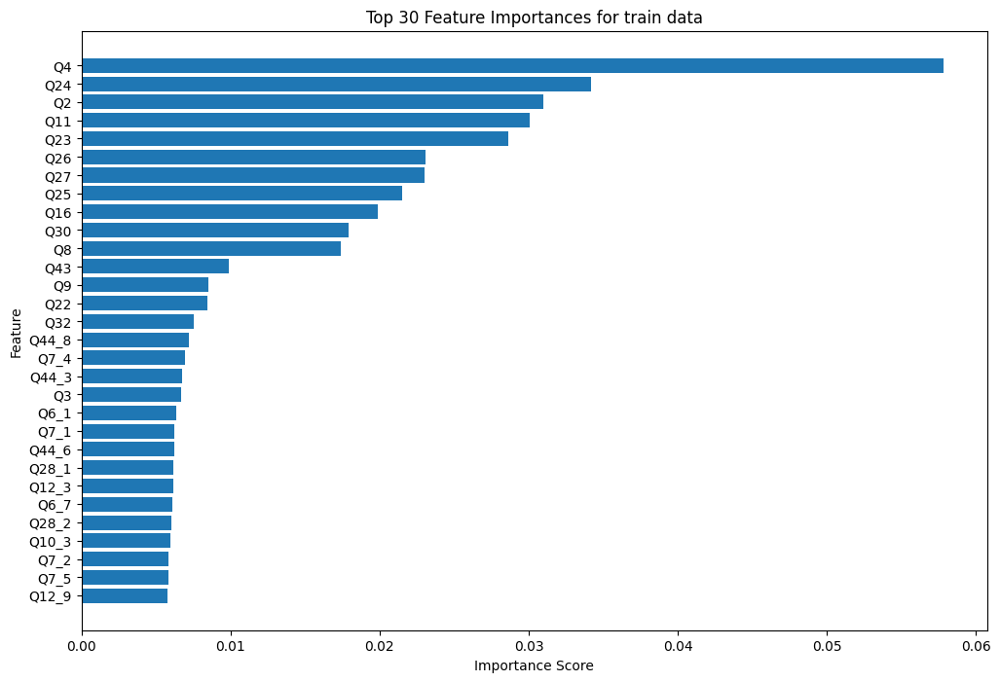

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=42)
model.fit(train_df, y_train)

feature_importances = model.feature_importances_
feature_names = train_df.columns

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False).head(30)

plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.gca().invert_yaxis()
plt.title('Top 30 Feature Importances for train data')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

## **Feature Selection**

- Select the features based on the criteria of your choice

In [15]:
selected_features_train = importance_df['Feature'].head(30).tolist()
print("Selected Features:", selected_features_train)

selected_feature_questions = {feature: questions[feature] for feature in selected_features_train}

print("\nSelected Features and Corresponding Questions:")
for feature, question in selected_feature_questions.items():
    print(f"{feature}: {question}")

train_df_selected = train_df[selected_features_train]

print("\nShape of train_df_selected:", train_df_selected.shape)
print(train_df_selected.head())


Selected Features: ['Q4', 'Q24', 'Q2', 'Q11', 'Q23', 'Q26', 'Q27', 'Q25', 'Q16', 'Q30', 'Q8', 'Q43', 'Q9', 'Q22', 'Q32', 'Q44_8', 'Q7_4', 'Q44_3', 'Q3', 'Q6_1', 'Q7_1', 'Q44_6', 'Q28_1', 'Q12_3', 'Q6_7', 'Q28_2', 'Q10_3', 'Q7_2', 'Q7_5', 'Q12_9']

Selected Features and Corresponding Questions:
Q4: In which country do you currently reside?
Q24: In what industry is your current employer/contract (or your most recent employer if retired)? - Selected Choice
Q2: What is your age (# years)?
Q11: For how many years have you been writing code and/or programming?
Q23: Select the title most similar to your current role (or most recent title if retired): - Selected Choice
Q26: Approximately how many individuals are responsible for data science workloads at your place of business?
Q27: Does your current employer incorporate machine learning methods into their business?
Q25: What is the size of the company where you are employed?
Q16: For how many years have you used machine learning methods?
Q30: 

## **Feature Engineering/Generation**

- Create new feature(s) using existing features!

## **Apply the same feature engineering/selection to test data**

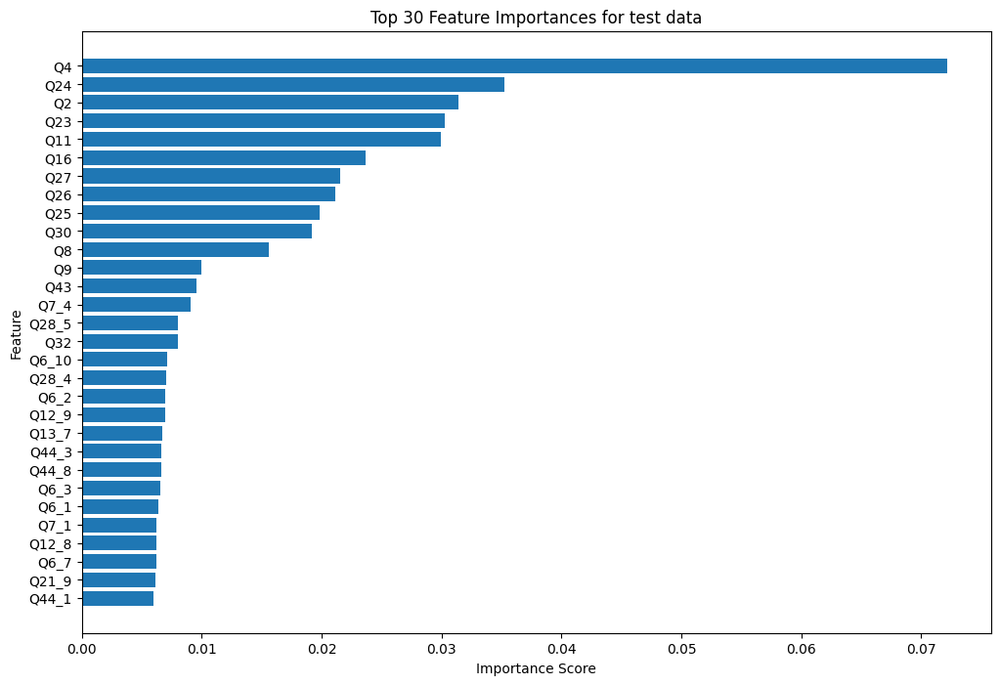

In [36]:
model = RandomForestRegressor(random_state=42)
model.fit(test_df, y_test)

feature_importances = model.feature_importances_
feature_names = train_df.columns

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False).head(30)

plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.gca().invert_yaxis()
plt.title('Top 30 Feature Importances for test data')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

In [17]:
selected_features_test = importance_df['Feature'].head(30).tolist()
print("Selected Features for Test Set:", selected_features_test)

selected_feature_questions_test = {feature: questions[feature] for feature in selected_features_test}

print("\nSelected Features and Corresponding Questions (Test Set):")
for feature, question in selected_feature_questions_test.items():
    print(f"{feature}: {question}")

test_df_selected = test_df[selected_features_test]
print("\nShape of test_df_selected:", test_df_selected.shape)
print(test_df_selected.head())


Selected Features for Test Set: ['Q4', 'Q24', 'Q2', 'Q23', 'Q11', 'Q16', 'Q27', 'Q26', 'Q25', 'Q30', 'Q8', 'Q9', 'Q43', 'Q7_4', 'Q28_5', 'Q32', 'Q6_10', 'Q28_4', 'Q6_2', 'Q12_9', 'Q13_7', 'Q44_3', 'Q44_8', 'Q6_3', 'Q6_1', 'Q7_1', 'Q12_8', 'Q6_7', 'Q21_9', 'Q44_1']

Selected Features and Corresponding Questions (Test Set):
Q4: In which country do you currently reside?
Q24: In what industry is your current employer/contract (or your most recent employer if retired)? - Selected Choice
Q2: What is your age (# years)?
Q23: Select the title most similar to your current role (or most recent title if retired): - Selected Choice
Q11: For how many years have you been writing code and/or programming?
Q16: For how many years have you used machine learning methods?
Q27: Does your current employer incorporate machine learning methods into their business?
Q26: Approximately how many individuals are responsible for data science workloads at your place of business?
Q25: What is the size of the company 

In [18]:
X_train = train_df_selected.values
X_test = test_df_selected.values
y_train = y_train.values
y_test = y_test.values
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(5695, 30) (2441, 30) (5695,) (2441,)


# Question 3: Model Implementation

In [19]:
temp_dataset = dataSet.copy()
temp_dataset.head()

,Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.0,0
2,1,0,1,0,0,1,1,0,0,1,...,1,1,0,0,0,0,0,0,1.0,1
3,2,0,2,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,1.0,1
4,3,0,3,0,0,0,0,0,1,1,...,1,0,1,0,0,0,0,0,2.0,2
5,3,0,3,0,0,0,1,0,0,1,...,1,0,1,0,1,0,0,0,2.0,2


## Implement Ordinal Logistic Regression Model

In [20]:
from sklearn.linear_model import LogisticRegression
import numpy as np


class OrdinalLogisticRegression:
    def __init__(self, max_iter=100, solver='newton-cg', C=1, penalty='l2'):
        self.max_iter = max_iter
        self.solver = solver
        self.C = C
        self.penalty = penalty  # New penalty parameter
        self.classes_ = []
        self.models_ = []

    def fit(self, X, y):
        self.classes_ = sorted(np.unique(y))
        self.models_ = []

        # Train k-1 binary logistic regression models
        for i, c in enumerate(self.classes_[:-1]):
            y_i = np.where(y <= c, 0, 1)
            model = LogisticRegression(
                max_iter=self.max_iter,
                solver=self.solver,
                C=self.C,
                penalty=self.penalty  # Use the specified penalty type
            )
            model.fit(X, y_i)
            self.models_.append(model)

        return self


    def predict_proba(self, X):
        assert len(self.models_) > 0, "Model is not fitted yet. Run .fit() first."

        # Predicted probabilities for k-1 binary logistic regression models
        binary_probabilities = np.empty((X.shape[0], len(self.models_), 2), dtype=float)

        # Make predictions of k-1 binary logistic regression models
        for i, model in enumerate(self.models_):
            binary_probabilities[:, i] = model.predict_proba(X)

        # Compute the probabilities to be in each class
        k = len(self.classes_)
        proba = np.empty((X.shape[0], k), dtype=float)

        proba[:, 0] = binary_probabilities[:, 0, 0]

        for i in range(1, k-1):
            # Probability of being in class i
            proba[:, i] = binary_probabilities[:, i, 0] - binary_probabilities[:, i-1, 0]

        proba[:, -1] = binary_probabilities[:, k-2, 1] # Probability for the last class

        assert np.allclose(proba.sum(axis=1), 1), 'There is a problem in the probability computation'
        return proba

    def predict(self, X):
        proba = self.predict_proba(X)
        return np.argmax(proba, axis=1)

    def get_params(self, deep=True):
        return {'max_iter': self.max_iter, 'solver': self.solver, 'C': self.C, 'penalty': self.penalty}
    # DO NOT CHANGE
    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self


## Run k-fold cross validation

- Report the average/variance of accuracies across folds

In [21]:
from sklearn.model_selection import cross_val_score
ordinal_model = OrdinalLogisticRegression(max_iter=100)

# Perform 10-fold cross-validation
scores = cross_val_score(ordinal_model, X_train, y_train, cv=10, scoring='accuracy')

# Calculate the average and variance of the accuracy scores
average_accuracy = np.mean(scores)
variance_accuracy = np.var(scores)

print("10-fold Cross-Validation Results:")
print(f"Average Accuracy: {average_accuracy:.4f}")
print(f"Variance of Accuracy: {variance_accuracy:.4f}")


10-fold Cross-Validation Results:
Average Accuracy: 0.3798
Variance of Accuracy: 0.0006


## Bias-variance trade-off

[bias_variance_decomp.py](https://github.com/rasbt/mlxtend/blob/master/mlxtend/evaluate/bias_variance_decomp.py)

Below is a function you can use to compute the bias and variance of your ordinal logistic regression model. Using this function, analyze the ordinal logistic regression model performance based on bias-variance trade-off.

In [22]:
### NOTE: You don't need to change anything in this code block! ###

def _draw_bootstrap_sample(rng, X, y):
    sample_indices = np.arange(X.shape[0])
    bootstrap_indices = rng.choice(
        sample_indices, size=sample_indices.shape[0], replace=True
    )
    return X[bootstrap_indices], y[bootstrap_indices]

def bias_variance_decomp(
    estimator,
    X_train,
    y_train,
    X_test,
    y_test,
    num_rounds=10,
    random_seed=0
):
    """
    estimator : object
        A classifier or regressor object or class implementing both a
        `fit` and `predict` method similar to the scikit-learn API.

    X_train : array-like, shape=(num_examples, num_features)
        A training dataset for drawing the bootstrap samples to carry
        out the bias-variance decomposition.

    y_train : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_train` examples.

    X_test : array-like, shape=(num_examples, num_features)
        The test dataset for computing the average loss, bias,
        and variance.

    y_test : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_test` examples.

    num_rounds : int (default=10)
        Number of bootstrap rounds (sampling from the training set)
        for performing the bias-variance decomposition. Each bootstrap
        sample has the same size as the original training set.

    random_seed : int (default=0)
        Random seed for the bootstrap sampling used for the
        bias-variance decomposition.

    Returns
    ----------
    avg_bias, avg_var : returns the average bias, and average bias (all floats),
                        where the average is computed over the data points
                        in the test set.

    """
    loss = "mse"

    for ary in (X_train, y_train, X_test, y_test):
        assert type(ary) == np.ndarray, \
            "X_train, y_train, X_test, y_test have to be NumPy array. \
            If e.g., X_train is a pandas DataFrame, convert it to NumPy array \
            via X_train=X_train.values."

    rng = np.random.RandomState(random_seed)

    # All the predictions across different rounds
    all_pred = np.zeros((num_rounds, y_test.shape[0]), dtype=np.float64)

    for i in range(num_rounds):
        # Randomly sample training data
        X_boot, y_boot = _draw_bootstrap_sample(rng, X_train, y_train)

        # Fit the model using the randomly sampled data
        pred = estimator.fit(X_boot, y_boot).predict(X_test)
        all_pred[i] = pred

    # Mean prediction across runs using different dataset for each data point
    main_predictions = np.mean(all_pred, axis=0)

    # Average bias across different rounds
    avg_bias = np.sum((main_predictions - y_test) ** 2) / y_test.size

    # Average variance across different rounds
    avg_var = np.sum((main_predictions - all_pred) ** 2) / all_pred.size

    return avg_bias, avg_var

In [23]:
# Usage example
model = OrdinalLogisticRegression()
avg_bias, avg_var = \
    bias_variance_decomp(model, X_train, y_train, X_test, y_test, num_rounds=10, random_seed=0)

In [24]:
print(avg_bias, avg_var)

14.759647685374848 2.5601392871773863


# **One hyperparameter that has a direct impact on the bias-variance trade-off**

In [25]:
C_values = [0.01, 0.1, 1, 10, 100]
results = {}

for C in C_values:
    model = OrdinalLogisticRegression(C=C)
    avg_bias, avg_var = bias_variance_decomp(model, X_train, y_train, X_test, y_test, num_rounds=10, random_seed=0)
    results[C] = {'avg_bias': avg_bias, 'avg_var': avg_var}

for C, metrics in results.items():
    print(f"C={C}: Average Bias = {metrics['avg_bias']:.4f}, Average Variance = {metrics['avg_var']:.4f}")




C=0.01: Average Bias = 14.1542, Average Variance = 1.4191
C=0.1: Average Bias = 14.5283, Average Variance = 2.3783
C=1: Average Bias = 14.7596, Average Variance = 2.5601
C=10: Average Bias = 14.7698, Average Variance = 2.5932
C=100: Average Bias = 14.7761, Average Variance = 2.5991


# Scaling/normalization

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import numpy as np

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train_scaled = scaler.fit_transform(y_train.reshape(-1, 1))
y_test_scaled = scaler.transform(y_test.reshape(-1, 1))


best_model = OrdinalLogisticRegression(C=0.01)

scores = cross_val_score(best_model, X_train_scaled, y_train, cv=10, scoring='accuracy')

average_accuracy = np.mean(scores)
variance_accuracy = np.var(scores)

print("10-fold Cross-Validation Results with C=0.01 and Scaled Data:")
print(f"Average Accuracy: {average_accuracy:.4f}")
print(f"Variance of Accuracy: {variance_accuracy:.4f}")


10-fold Cross-Validation Results with C=0.01 and Scaled Data:
Average Accuracy: 0.3814
Variance of Accuracy: 0.0006


# Question 4: Model Tuning

- What are the hyperparameters we can potentially set for our ordinal logistic regression model?
- Which hyperparameters seem to be worthwhile to tune?

## Grid Search

- Grid search will take time to complete - but if it does not finish in a few hours, you're probably trying too many combinations
- A recommended approach is to try a small number of combinations with a wide range first (for continuous value hyperparameters)! Then gradually increase the points that seem to be near optimal

In [37]:
temp_dataset = dataSet.copy()
temp_dataset.head()

,Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.0,0
2,1,0,1,0,0,1,1,0,0,1,...,1,1,0,0,0,0,0,0,1.0,1
3,2,0,2,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,1.0,1
4,3,0,3,0,0,0,0,0,1,1,...,1,0,1,0,0,0,0,0,2.0,2
5,3,0,3,0,0,0,1,0,0,1,...,1,0,1,0,1,0,0,0,2.0,2


In [39]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score, mean_squared_error, accuracy_score
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['lbfgs', 'saga','newton-cg']
}
mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

grid_search = GridSearchCV(
    OrdinalLogisticRegression(),
    param_grid,
    cv=10,
    scoring={'chosen_metric': mse_scorer, 'accuracy': 'accuracy', 'mae': mae_scorer},
    refit='chosen_metric'
)

grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_
best_mae = min(grid_search.cv_results_['mean_test_mae'])
best_accuracy = max(grid_search.cv_results_['mean_test_accuracy'])

print("Best Parameters:", best_params)
print("Best Performance Score (Primary Metric):", best_score)
print("Best Accuracy:", best_accuracy)
print("Best MAE:", -best_mae)

Best Parameters: {'C': 0.001, 'solver': 'lbfgs'}
Best Performance Score (Primary Metric): -13.680756945086793
Best Accuracy: 0.38138932568680045
Best MAE: 2.67810563315142


## Visualize the feature importance of your model

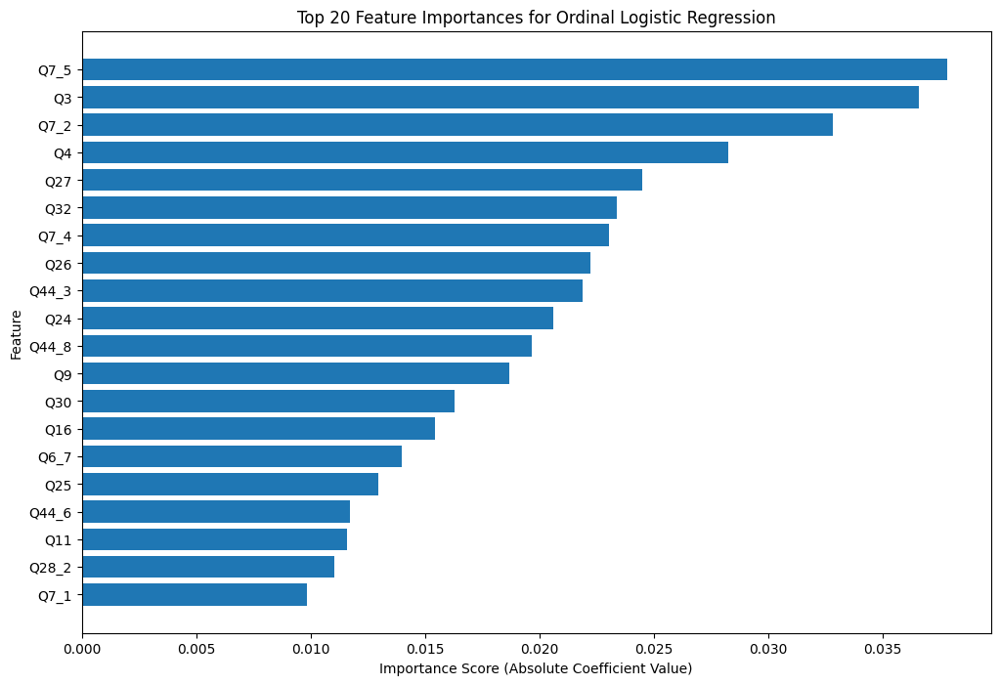

In [40]:
best_model.fit(X_train_scaled, y_train)

# Extract coefficients and calculate absolute values for feature importance
feature_importances = np.abs(best_model.models_[0].coef_).flatten()
feature_names = train_df_selected.columns  # Assuming `train_df_selected` contains the selected features

# Create a DataFrame for easy sorting and visualization
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False).head(20)  # Top 20 features

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.gca().invert_yaxis()  # Highest importance at the top
plt.title('Top 20 Feature Importances for Ordinal Logistic Regression')
plt.xlabel('Importance Score (Absolute Coefficient Value)')
plt.ylabel('Feature')
plt.show()





# Question 5: Testing

In [34]:
best_model.fit(X_train, y_train)
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculate performance metrics for training and test sets
from sklearn.metrics import accuracy_score, mean_squared_error

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

train_f1 = f1_score(y_train, y_train_pred, average='weighted')
test_f1 = f1_score(y_test, y_test_pred, average='weighted')

print("Training Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)
print("Training MSE:", train_mse)
print("Test MSE:", test_mse)
print("Training F1 Score:", train_f1)
print("Test F1 Score:", test_f1)

Training Accuracy: 0.38402107111501316
Test Accuracy: 0.383039737812372
Training MSE: 14.050746268656717
Test MSE: 14.086849651782057
Training F1 Score: 0.2279800974487545
Test F1 Score: 0.2280944492987517


In [31]:
#TODO: Using the best-performing model, evaluate the model performance both on the training set and test set

In [32]:
#TODO: Plot the distribution of true target variable values and their predictions on both the training set and test set

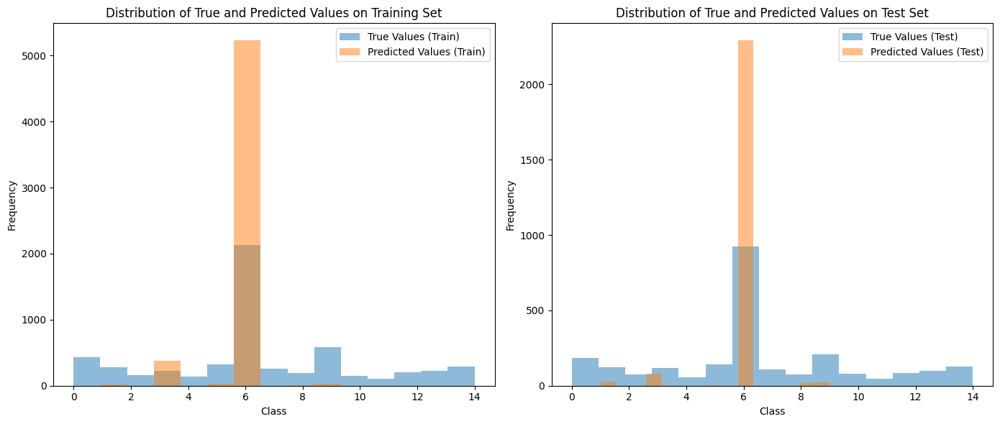

In [33]:
import matplotlib.pyplot as plt

# Plot distribution for the training set
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.hist(y_train, alpha=0.5, label="True Values (Train)", bins=len(set(y_train)))
plt.hist(y_train_pred, alpha=0.5, label="Predicted Values (Train)", bins=len(set(y_train)))
plt.title("Distribution of True and Predicted Values on Training Set")
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.legend()

# Plot distribution for the test set
plt.subplot(1, 2, 2)
plt.hist(y_test, alpha=0.5, label="True Values (Test)", bins=len(set(y_test)))
plt.hist(y_test_pred, alpha=0.5, label="Predicted Values (Test)", bins=len(set(y_test)))
plt.title("Distribution of True and Predicted Values on Test Set")
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.legend()

plt.tight_layout()
plt.show()

